## 1. Configuration Initiale et Importations


In [1]:
import os
import requests
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import tqdm
from tqdm import tqdm 
from tqdm.notebook import tqdm
import base64
import io

In [2]:
# import private.py  depuis C:\Users\Windows 11\Desktop\AI_Engineer\Projets\projet2\.env\private.py

from dotenv import load_dotenv
load_dotenv(dotenv_path=r"C:\Users\Windows 11\Desktop\AI_Engineer\Projets\projet2\.env\private.py")
api_key = os.getenv("api_token")
# print les 5 dernier digit de la clé
if api_key:
    api_token = api_key
    print(f"API Key chargée : {api_key[:5]}***")  # masque pour affichage
else:
    api_token = None
    print("API Key non trouvée. Vérifiez le fichier .env et la variable 'api_token'.")



API Key chargée : hf_Wu***


## 2. API d'Inférence Hugging Face


In [3]:

API_URL = "https://router.huggingface.co/hf-inference/models/sayeed99/segformer_b3_clothes"

headers = {
    "Authorization": f"Bearer {api_token}"
}

image_dir = r"C:\Users\Windows 11\Desktop\AI_Engineer\Projets\asset\IMG"
image_paths = [os.path.join(image_dir, fname)
               for fname in os.listdir(image_dir)
               if fname.lower().endswith(('.png'))]

if not image_paths:
    print(f"Aucune image trouvée dans '{image_dir}'. Veuillez y ajouter des images.")
else:
    print(f"{len(image_paths)} image(s) à traiter : {image_paths}")



50 image(s) à traiter : ['C:\\Users\\Windows 11\\Desktop\\AI_Engineer\\Projets\\asset\\IMG\\image_0.png', 'C:\\Users\\Windows 11\\Desktop\\AI_Engineer\\Projets\\asset\\IMG\\image_1.png', 'C:\\Users\\Windows 11\\Desktop\\AI_Engineer\\Projets\\asset\\IMG\\image_10.png', 'C:\\Users\\Windows 11\\Desktop\\AI_Engineer\\Projets\\asset\\IMG\\image_11.png', 'C:\\Users\\Windows 11\\Desktop\\AI_Engineer\\Projets\\asset\\IMG\\image_12.png', 'C:\\Users\\Windows 11\\Desktop\\AI_Engineer\\Projets\\asset\\IMG\\image_13.png', 'C:\\Users\\Windows 11\\Desktop\\AI_Engineer\\Projets\\asset\\IMG\\image_14.png', 'C:\\Users\\Windows 11\\Desktop\\AI_Engineer\\Projets\\asset\\IMG\\image_15.png', 'C:\\Users\\Windows 11\\Desktop\\AI_Engineer\\Projets\\asset\\IMG\\image_16.png', 'C:\\Users\\Windows 11\\Desktop\\AI_Engineer\\Projets\\asset\\IMG\\image_17.png', 'C:\\Users\\Windows 11\\Desktop\\AI_Engineer\\Projets\\asset\\IMG\\image_18.png', 'C:\\Users\\Windows 11\\Desktop\\AI_Engineer\\Projets\\asset\\IMG\\image_19

test site

## 3. Fonctions Utilitaires pour le Traitement des Masques


In [4]:
import os
import io
import time
import base64
import logging
from pathlib import Path
from typing import List, Optional, Dict, Any, Union

import requests
from tqdm import tqdm
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np


logging.basicConfig(level=logging.INFO, format='%(levelname)s: %(message)s')
logger = logging.getLogger(__name__)

def get_image_dimensions(img_path):
    """
    Récupère les dimensions (largeur, hauteur) d'une image.

    Args:
        img_path (str): Chemin vers l'image.

    Returns:
        tuple: (width, height) de l'image.
    """
    original_image = Image.open(img_path)
    return original_image.size
def segment_images_batch(list_of_image_paths: List[Union[str, Path]], api_url: str, headers: Dict) -> List[Optional[Dict[str, Any]]]:
    """Segmente une liste d'images via l'API Hugging Face."""
    batch_segmentations = []

    for img_path in tqdm(list_of_image_paths, desc="Segmentation des images"):
        try:
            with open(img_path, "rb") as f:
                image_data = f.read()

            response = requests.post(
                api_url,
                headers={**headers, "Content-Type": "image/png"},
                data=image_data,
                timeout=30
            )
            response.raise_for_status()
            batch_segmentations.append(response.json())

        except Exception as e:
            logger.error(f"Erreur lors du traitement de {img_path}: {e}")
            batch_segmentations.append(None)

        time.sleep(1)

    return batch_segmentations


def _extract_mask_from_response(mask_obj: Any) -> Optional[Image.Image]:
    """Extraction robuste du masque selon format de réponse API HF."""
    
    if isinstance(mask_obj, list):
        if len(mask_obj) == 0:
            return None
        mask_obj = mask_obj[0]
    
    if isinstance(mask_obj, dict):
        mask_data = mask_obj.get("mask") or mask_obj.get("image")
        
        if mask_data is None:
            return None
        
        if isinstance(mask_data, str):
            try:
                if mask_data.startswith("data:image"):
                    mask_data = mask_data.split(",", 1)[1]
                
                mask_bytes = base64.b64decode(mask_data)
                return Image.open(io.BytesIO(mask_bytes))
            
            except Exception as e:
                logger.error(f"Décodage base64 échoué: {e}")
                return None
    
    if isinstance(mask_obj, Image.Image):
        return mask_obj
    
    if isinstance(mask_obj, np.ndarray):
        try:
            if mask_obj.max() > 255:
                mask_obj = (mask_obj * 255 / mask_obj.max()).astype(np.uint8)
            else:
                mask_obj = mask_obj.astype(np.uint8)
            
            return Image.fromarray(mask_obj)
        
        except Exception as e:
            logger.error(f"Conversion numpy vers PIL échouée: {e}")
            return None
    
    return None


def _validate_image_path(img_path: Union[str, Path]) -> bool:
    """Validation de l'accessibilité et format d'un fichier image."""
    path_obj = Path(img_path)
    
    if not path_obj.exists() or not path_obj.is_file():
        return False
    
    valid_extensions = {'.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff'}
    return path_obj.suffix.lower() in valid_extensions


def _load_original_image(img_path: Union[str, Path]) -> Optional[Image.Image]:
    """Chargement sécurisé de l'image originale."""
    try:
        img = Image.open(img_path)
        if img.mode != 'RGB':
            img = img.convert('RGB')
        return img
    except Exception as e:
        logger.error(f"Impossible de charger {img_path}: {e}")
        return None


def display_segmented_images_batch(
    original_image_paths: List[Union[str, Path]],
    segmentation_masks: List[Any],
    figsize: tuple = (14, 6),
    mask_cmap: str = 'jet',
    mask_alpha: float = 0.7
) -> None:
    """Affichage côte à côte des images originales et masques segmentés."""
    
    if not original_image_paths or not segmentation_masks:
        logger.warning("Listes vides fournies.")
        return
    
    valid_pairs = []
    
    for img_path, mask_obj in zip(original_image_paths, segmentation_masks):
        if not _validate_image_path(img_path):
            continue
        
        mask_img = _extract_mask_from_response(mask_obj)
        if mask_img is None:
            continue
        
        original_img = _load_original_image(img_path)
        if original_img is None:
            continue
        
        valid_pairs.append((img_path, original_img, mask_img))
    
    if not valid_pairs:
        logger.error("Aucune paire image-masque valide à afficher.")
        return
    
    num_valid = len(valid_pairs)
    fig = plt.figure(figsize=(figsize[0], num_valid * figsize[1] // 2))
    
    for row_idx, (img_path, original_img, mask_img) in enumerate(valid_pairs):
        ax1 = plt.subplot(num_valid, 2, row_idx * 2 + 1)
        ax1.imshow(original_img)
        ax1.set_title(f"Image : {Path(img_path).name}", fontsize=10, fontweight='bold')
        ax1.axis('off')
        
        ax2 = plt.subplot(num_valid, 2, row_idx * 2 + 2)
        ax2.imshow(mask_img, cmap=mask_cmap, alpha=mask_alpha)
        ax2.set_title("Masque segmenté", fontsize=10, fontweight='bold')
        ax2.axis('off')
    
    plt.tight_layout()
    plt.show()



## 4. Segmentation d'une Seule Image

In [5]:


headers = {
    "Authorization": f"Bearer {api_token}"
}
 

if image_paths:
    single_image_path = image_paths[0] # Prenons la première image de notre liste
    print(f"Traitement de l'image : {single_image_path}")

    try:
        # Lire l'image en binaire
        with open(single_image_path, "rb") as f:
            image_data = f.read()
       
        

        # Maintenant, utilisé l'API huggingface
        response = requests.post(
            API_URL, 
            headers={**headers, "Content-Type": "image/png"}, 
            data=image_data)
        response.raise_for_status()  # Vérifie si la requête a réussi
        # ainsi que les fonctions données plus haut pour ségmenter vos images.
        results = response.json()
        print("Réponse brute de l'API :")
        print(results)

        width, height = get_image_dimensions(single_image_path)
        masks = create_masks(results, width, height)

    except Exception as e:
        print(f"Une erreur est survenue : {e}")
else:
    print("Aucune image à traiter. Vérifiez la configuration de 'image_dir' et 'max_images'.")



Traitement de l'image : C:\Users\Windows 11\Desktop\AI_Engineer\Projets\asset\IMG\image_0.png
Réponse brute de l'API :
[{'score': 1, 'label': 'Background', 'mask': 'iVBORw0KGgoAAAANSUhEUgAAAZAAAAJYCAAAAABph+9UAAAJf0lEQVR4nO3d3XLaWBBF4cOU3/+VmYvENj/CCEPotbvXuphKPKmKdD71kSAOORyXkfqv+gDsPEFgCQJLEFiCwBIEliCwBIElCCxBYAkCSxBYgsASBJYgsASBJQgsQWAJAksQWILAEgSWILAEgSUILEFgCQJLEFiCwBIEliCwBIElCCxBYAkCSxBYgsASBJYgsASBJQgsQWAJAksQWILAEgSWILAEgSUILEFgCQLro/oAXtJhrbV6fHrkIf00DpdfCD+h9C3rymMdrr+UVPSE3Fz64JMKBvlxEmJPK3fL+nlnit24YkHuLnioSCrIjuXOFAkF2bXYkSKZIDuXOlEkEmT3QgeKJII8sMx5IoEgeYv8SIEgDxWnlwfy4BKnicSBpC3wo8WBdC8N5PEBCRupNJD2DQDJGpEwkKzF/U1hIL8qSjELJGppf1cWyIBGgCQNVhRI0sL+tiiQCQkCKwnk9ztW0F6XBDKiIJCgy/yJgkCeKQdzCEhOOSA5F/lT5YAMSRBYgsCaAhJzB4oBiVnRJ4sBmZIgsFJApuxYMSBjovy16M8JOJ79/Hj5v58IcqL3YoCcrPdx6+cv2bH+ninjjG+GOLyz5T5eLP7x8he8IMJJ34gH8r4Ip34VAaTyCQpw+udNf8rCPU4DQGrXhCZSv2UBVqR8DU4qnxCAB+IYPqueEMxaUKakdkJAn2pFOZJSEMoirLUwB1MJAlkCVuU3dU6M60MQWIUgjCuSlhPyHeIKqQNBnD4vJ+QkwjVSBkI4+asAB+WEwBIEliCwqkA

## test

## 5. Segmentation de Plusieurs Images (Batch)


In [6]:
import os
import io
import time
import base64
import logging
from pathlib import Path
from typing import List, Optional, Dict, Any, Union

import requests
from tqdm import tqdm
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np


logging.basicConfig(level=logging.INFO, format='%(levelname)s: %(message)s')
logger = logging.getLogger(__name__)


def segment_images_batch(list_of_image_paths: List[Union[str, Path]]) -> List[Optional[Dict[str, Any]]]:
    """Segmente une liste d'images via l'API Hugging Face."""
    batch_segmentations = []

    for img_path in tqdm(list_of_image_paths, desc="Segmentation des images"):
        try:
            with open(img_path, "rb") as f:
                image_data = f.read()

            response = requests.post(
                API_URL,
                headers={**headers, "Content-Type": "image/png"},
                data=image_data,
                timeout=30
            )
            response.raise_for_status()
            batch_segmentations.append(response.json())

        except Exception as e:
            logger.error(f"Erreur lors du traitement de {img_path}: {e}")
            batch_segmentations.append(None)

        time.sleep(1)

    return batch_segmentations

# ============================================================================
# FONCTIONS UTILITAIRES POUR LE TRAITEMENT DES MASQUES
# ============================================================================

CLASS_MAPPING = {
    "Background": 0,
    "Hat": 1,
    "Hair": 2,
    "Sunglasses": 3,
    "Upper-clothes": 4,
    "Skirt": 5,
    "Pants": 6,
    "Dress": 7,
    "Belt": 8,
    "Left-shoe": 9,
    "Right-shoe": 10,
    "Face": 11,
    "Left-leg": 12,
    "Right-leg": 13,
    "Left-arm": 14,
    "Right-arm": 15,
    "Bag": 16,
    "Scarf": 17
}


def get_image_dimensions(img_path):
    """
    Récupère les dimensions (largeur, hauteur) d'une image.

    Args:
        img_path (str): Chemin vers l'image.

    Returns:
        tuple: (width, height) de l'image.
    """
    original_image = Image.open(img_path)
    return original_image.size


def decode_base64_mask(base64_string, width, height):
    """
    Décode un masque encodé en base64 en tableau NumPy.

    Args:
        base64_string (str): Masque encodé en base64.
        width (int): Largeur cible.
        height (int): Hauteur cible.

    Returns:
        np.ndarray: Masque canal unique (H, W).
    """
    mask_data = base64.b64decode(base64_string)
    mask_image = Image.open(io.BytesIO(mask_data))
    mask_array = np.array(mask_image)
    
    # Prendre le premier canal si RGB
    if len(mask_array.shape) == 3:
        mask_array = mask_array[:, :, 0]
    
    # Redimensionner à la taille cible
    mask_image = Image.fromarray(mask_array).resize((width, height), Image.NEAREST)
    return np.array(mask_image)


def create_masks(results, width, height):
    """
    Combine les masques de plusieurs classes en un seul masque de segmentation.

    Args:
        results (list): Liste de dictionnaires avec clés 'label' et 'mask'.
        width (int): Largeur cible.
        height (int): Hauteur cible.

    Returns:
        np.ndarray: Masque de segmentation combiné avec IDs de classe.
    """
    combined_mask = np.zeros((height, width), dtype=np.uint8)
    
    # Traiter les masques non-Background en premier
    for result in results:
        label = result['label']
        class_id = CLASS_MAPPING.get(label, 0)
        
        if class_id == 0:  # Ignorer Background pour l'instant
            continue
        
        mask_array = decode_base64_mask(result['mask'], width, height)
        combined_mask[mask_array > 0] = class_id
    
    # Traiter Background en dernier
    for result in results:
        if result['label'] == 'Background':
            mask_array = decode_base64_mask(result['mask'], width, height)
            combined_mask[mask_array > 0] = 0
    
    return combined_mask
def _extract_mask_from_response(mask_obj: Any) -> Optional[Image.Image]:
    """Extraction robuste du masque selon format de réponse API HF."""
    
    if isinstance(mask_obj, list):
        if len(mask_obj) == 0:
            return None
        mask_obj = mask_obj[0]
    
    if isinstance(mask_obj, dict):
        mask_data = mask_obj.get("mask") or mask_obj.get("image")
        
        if mask_data is None:
            logger.warning(f"Clés ('mask'/'image') absentes. Disponibles: {list(mask_obj.keys())}")
            return None
        
        if isinstance(mask_data, str):
            try:
                if mask_data.startswith("data:image"):
                    mask_data = mask_data.split(",", 1)[1]
                
                mask_bytes = base64.b64decode(mask_data)
                return Image.open(io.BytesIO(mask_bytes))
            
            except Exception as e:
                logger.error(f"Décodage base64 échoué: {e}")
                return None
    
    if isinstance(mask_obj, Image.Image):
        return mask_obj
    
    if isinstance(mask_obj, np.ndarray):
        try:
            if mask_obj.max() > 255:
                mask_obj = (mask_obj * 255 / mask_obj.max()).astype(np.uint8)
            else:
                mask_obj = mask_obj.astype(np.uint8)
            
            return Image.fromarray(mask_obj)
        
        except Exception as e:
            logger.error(f"Conversion numpy vers PIL échouée: {e}")
            return None
    
    logger.warning(f"Type de masque non géré: {type(mask_obj)}")
    return None


def _validate_image_path(img_path: Union[str, Path]) -> bool:
    """Validation de l'accessibilité et format d'un fichier image."""
    path_obj = Path(img_path)
    
    if not path_obj.exists():
        logger.error(f"Fichier inexistant: {img_path}")
        return False
    
    if not path_obj.is_file():
        logger.error(f"N'est pas un fichier: {img_path}")
        return False
    
    valid_extensions = {'.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff'}
    if path_obj.suffix.lower() not in valid_extensions:
        logger.error(f"Extension non supportée: {path_obj.suffix}")
        return False
    
    return True


def _load_original_image(img_path: Union[str, Path]) -> Optional[Image.Image]:
    """Chargement sécurisé de l'image originale."""
    try:
        img = Image.open(img_path)
        if img.mode != 'RGB':
            img = img.convert('RGB')
        return img
    
    except Exception as e:
        logger.error(f"Impossible de charger {img_path}: {e}")
        return None


def display_segmented_images_batch(
    original_image_paths: List[Union[str, Path]],
    segmentation_masks: List[Any],
    figsize: tuple = (14, 6),
    mask_cmap: str = 'jet',
    mask_alpha: float = 0.7
) -> None:
    """Affichage côte à côte des images originales et masques segmentés."""
    
    if not original_image_paths or not segmentation_masks:
        logger.warning("Listes vides fournies.")
        return
    
    if len(original_image_paths) != len(segmentation_masks):
        logger.warning(
            f"Nombres d'images et masques différents: "
            f"{len(original_image_paths)} vs {len(segmentation_masks)}"
        )
    
    valid_pairs = []
    
    for img_path, mask_obj in zip(original_image_paths, segmentation_masks):
        if not _validate_image_path(img_path):
            continue
        
        mask_img = _extract_mask_from_response(mask_obj)
        if mask_img is None:
            logger.info(f"Masque invalide pour {Path(img_path).name}.")
            continue
        
        original_img = _load_original_image(img_path)
        if original_img is None:
            continue
        
        valid_pairs.append((img_path, original_img, mask_img))
    
    if not valid_pairs:
        logger.error("Aucune paire image-masque valide à afficher.")
        return
    
    num_valid = len(valid_pairs)
    fig = plt.figure(figsize=(figsize[0], num_valid * figsize[1] // 2))
    
    for row_idx, (img_path, original_img, mask_img) in enumerate(valid_pairs):
        ax1 = plt.subplot(num_valid, 2, row_idx * 2 + 1)
        ax1.imshow(original_img)
        ax1.set_title(f"Image : {Path(img_path).name}", fontsize=10, fontweight='bold')
        ax1.axis('off')
        
        ax2 = plt.subplot(num_valid, 2, row_idx * 2 + 2)
        ax2.imshow(mask_img, cmap=mask_cmap, alpha=mask_alpha)
        ax2.set_title("Masque segmenté", fontsize=10, fontweight='bold')
        ax2.axis('off')
    
    plt.tight_layout()
    logger.info(f"Affichage de {num_valid} paire(s) image-masque.")
    plt.show()

In [7]:
# ============================================================================
# 5. SEGMENTATION EN BATCH - Fonction à Implémenter
# ============================================================================

def segment_images_batch(list_of_image_paths):
    """
    Segmente une liste d'images en utilisant l'API Hugging Face.

    Args:
        list_of_image_paths (list): Liste des chemins vers les images.

    Returns:
        list: Liste des masques de segmentation (tableaux NumPy).
              Contient None si une image n'a pas pu être traitée.
    """
    batch_segmentations = []

    for img_path in tqdm(list_of_image_paths, desc="Segmentation des images"):
        try:
            # Lire l'image en binaire
            with open(img_path, "rb") as f:
                image_data = f.read()

            # Déterminer le Content-Type selon l'extension
            content_type = "image/png" if img_path.lower().endswith('.png') else "image/jpeg"
            
            # Envoyer la requête POST à l'API HF
            response = requests.post(
                API_URL,
                headers={**headers, "Content-Type": content_type},
                data=image_data,
                timeout=30
            )
            response.raise_for_status()
            
            # Récupérer les résultats JSON
            results = response.json()
            
            # Obtenir dimensions de l'image originale
            width, height = get_image_dimensions(img_path)
            
            # Créer le masque segmenté combiné
            segmentation_mask = create_masks(results, width, height)
            
            batch_segmentations.append(segmentation_mask)

        except Exception as e:
            print(f"Erreur lors du traitement de {img_path}: {e}")
            batch_segmentations.append(None)

        # Pause pour éviter de surcharger l'API
        time.sleep(1)

    return batch_segmentations


# Appeler la fonction pour segmenter les images listées dans image_paths
if image_paths:
    print(f"\nTraitement de {len(image_paths)} image(s) en batch...")
    batch_seg_results = segment_images_batch(image_paths)
    print("Traitement en batch terminé.")
else:
    batch_seg_results = []
    print("Aucune image à traiter en batch.")



Traitement de 50 image(s) en batch...


Segmentation des images: 100%|██████████| 50/50 [02:22<00:00,  2.84s/it]

Traitement en batch terminé.


In [8]:
## 6. Affichage des Résultats en Batch

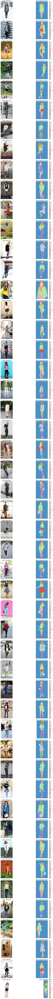

Affichage de 50 paire(s) image-masque réussie.


In [9]:

def display_segmented_images_batch(original_image_paths, segmentation_masks):
    """
    Affiche les images originales et leurs masques segmentés côte à côte.

    Args:
        original_image_paths (list): Liste des chemins des images originales.
        segmentation_masks (list): Liste des masques segmentés (NumPy arrays).
    """
    
    if not original_image_paths or not segmentation_masks:
        print("Listes vides, rien à afficher.")
        return
    
    # Compter les paires valides (image existe + masque n'est pas None)
    valid_count = sum(1 for img_path, mask in zip(original_image_paths, segmentation_masks) 
                      if mask is not None and os.path.exists(img_path))
    
    if valid_count == 0:
        print("Aucune paire image-masque valide à afficher.")
        return
    
    # Créer la figure avec nombre de lignes adapté
    fig = plt.figure(figsize=(14, valid_count * 4))
    
    row_idx = 0
    for img_path, mask in zip(original_image_paths, segmentation_masks):
        # Vérifier que l'image et le masque sont valides
        if mask is None or not os.path.exists(img_path):
            continue
        
        # Charger l'image originale
        original_img = Image.open(img_path)
        
        # Afficher l'image originale (colonne 1)
        ax1 = plt.subplot(valid_count, 2, row_idx * 2 + 1)
        ax1.imshow(original_img)
        ax1.set_title(f"Image : {os.path.basename(img_path)}", fontsize=10, fontweight='bold')
        ax1.axis('off')
        
        # Afficher le masque segmenté (colonne 2)
        ax2 = plt.subplot(valid_count, 2, row_idx * 2 + 2)
        # Utiliser une colormap pour mieux visualiser les différentes classes
        im = ax2.imshow(mask, cmap='tab20', alpha=0.8)
        ax2.set_title("Masque segmenté (par classe)", fontsize=10, fontweight='bold')
        ax2.axis('off')
        
        # Ajouter une colorbar
        cbar = plt.colorbar(im, ax=ax2, fraction=0.046, pad=0.04)
        cbar.set_label('Classe ID', fontsize=8)
        
        row_idx += 1
    
    plt.tight_layout()
    plt.show()
    print(f"Affichage de {valid_count} paire(s) image-masque réussie.")


# Afficher les résultats du batch
if batch_seg_results:
    print("\n" + "="*60)
    display_segmented_images_batch(image_paths, batch_seg_results)
else:
    print("Aucun résultat de segmentation à afficher.")

In [10]:
vcbhx

NameError: name 'vcbhx' is not defined

# Optimisation via autre modele 


In [ ]:
import os
import time
import requests
from tqdm.notebook import tqdm
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import base64
import io


# ============================================================================
# CONFIGURATION
# ============================================================================

API_URL = "https://router.huggingface.co/hf-inference/models/sayeed99/segformer_b3_clothes"

headers = {
    "Authorization": f"Bearer {api_token}"
}

image_dir = r"C:\Users\Windows 11\Desktop\AI_Engineer\Projets\asset\IMG"
image_paths = [os.path.join(image_dir, fname)
               for fname in os.listdir(image_dir)
               if fname.lower().endswith(('.png'))]

if not image_paths:
    print(f"Aucune image trouvée dans '{image_dir}'. Veuillez y ajouter des images.")
else:
    print(f"{len(image_paths)} image(s) à traiter : {image_paths}")


# ============================================================================
# MAPPAGE DES CLASSES ET COULEURS
# ============================================================================

CLASS_MAPPING = {
    "Background": 0,
    "Hat": 1,
    "Hair": 2,
    "Sunglasses": 3,
    "Upper-clothes": 4,
    "Skirt": 5,
    "Pants": 6,
    "Dress": 7,
    "Belt": 8,
    "Left-shoe": 9,
    "Right-shoe": 10,
    "Face": 11,
    "Left-leg": 12,
    "Right-leg": 13,
    "Left-arm": 14,
    "Right-arm": 15,
    "Bag": 16,
    "Scarf": 17
}

# Mappage classe -> couleur RGB (correspondant à l'image)
COLOR_MAPPING = {
    0: (0, 0, 0),           # Background - Noir
    1: (255, 255, 0),       # Hat - Jaune
    2: (255, 165, 0),       # Hair - Orange
    3: (255, 0, 255),       # Sunglasses - Magenta
    4: (255, 0, 0),         # Upper-clothes - Rouge
    5: (255, 255, 0),       # Skirt - Jaune
    6: (0, 128, 0),         # Pants - Vert
    7: (0, 0, 255),         # Dress - Bleu
    8: (128, 0, 128),       # Belt - Violet
    9: (255, 255, 0),       # Left-shoe - Jaune
    10: (0, 0, 255),        # Right-shoe - Bleu
    11: (135, 206, 235),    # Face - Bleu ciel
    12: (173, 216, 230),    # Left-leg - Bleu pâle
    13: (173, 216, 230),    # Right-leg - Bleu pâle
    14: (173, 216, 230),    # Left-arm - Bleu pâle
    15: (173, 216, 230),    # Right-arm - Bleu pâle
    16: (255, 165, 0),      # Bag - Orange
    17: (128, 0, 128)       # Scarf - Violet
}

# Inverse mapping pour affichage légende
REVERSE_CLASS_MAPPING = {v: k for k, v in CLASS_MAPPING.items()}

# ============================================================================
# FONCTIONS UTILITAIRES POUR LE TRAITEMENT DES MASQUES
# ============================================================================

CLASS_MAPPING = {
    "Background": 0,
    "Hat": 1,
    "Hair": 2,
    "Sunglasses": 3,
    "Upper-clothes": 4,
    "Skirt": 5,
    "Pants": 6,
    "Dress": 7,
    "Belt": 8,
    "Left-shoe": 9,
    "Right-shoe": 10,
    "Face": 11,
    "Left-leg": 12,
    "Right-leg": 13,
    "Left-arm": 14,
    "Right-arm": 15,
    "Bag": 16,
    "Scarf": 17
}


def get_image_dimensions(img_path):
    """
    Récupère les dimensions (largeur, hauteur) d'une image.

    Args:
        img_path (str): Chemin vers l'image.

    Returns:
        tuple: (width, height) de l'image.
    """
    original_image = Image.open(img_path)
    return original_image.size


def decode_base64_mask(base64_string, width, height):
    """
    Décode un masque encodé en base64 en tableau NumPy.

    Args:
        base64_string (str): Masque encodé en base64.
        width (int): Largeur cible.
        height (int): Hauteur cible.

    Returns:
        np.ndarray: Masque canal unique (H, W).
    """
    mask_data = base64.b64decode(base64_string)
    mask_image = Image.open(io.BytesIO(mask_data))
    mask_array = np.array(mask_image)
    
    # Prendre le premier canal si RGB
    if len(mask_array.shape) == 3:
        mask_array = mask_array[:, :, 0]
    
    # Redimensionner à la taille cible
    mask_image = Image.fromarray(mask_array).resize((width, height), Image.NEAREST)
    return np.array(mask_image)


def create_masks(results, width, height):
    """
    Combine les masques de plusieurs classes en un seul masque de segmentation.

    Args:
        results (list): Liste de dictionnaires avec clés 'label' et 'mask'.
        width (int): Largeur cible.
        height (int): Hauteur cible.

    Returns:
        np.ndarray: Masque de segmentation combiné avec IDs de classe.
    """
    combined_mask = np.zeros((height, width), dtype=np.uint8)
    
    # Traiter les masques non-Background en premier
    for result in results:
        label = result['label']
        class_id = CLASS_MAPPING.get(label, 0)
        
        if class_id == 0:  # Ignorer Background pour l'instant
            continue
        
        mask_array = decode_base64_mask(result['mask'], width, height)
        combined_mask[mask_array > 0] = class_id
    
    # Traiter Background en dernier
    for result in results:
        if result['label'] == 'Background':
            mask_array = decode_base64_mask(result['mask'], width, height)
            combined_mask[mask_array > 0] = 0
    
    return combined_mask

# ============================================================================
# 5. SEGMENTATION EN BATCH
# ============================================================================

def segment_images_batch(list_of_image_paths):
    """
    Segmente une liste d'images en utilisant l'API Hugging Face.

    Args:
        list_of_image_paths (list): Liste des chemins vers les images.

    Returns:
        list: Liste des réponses API.
              Contient None si une image n'a pas pu être traitée.
    """
    batch_segmentations = []

    for img_path in tqdm(list_of_image_paths, desc="Segmentation des images"):
        try:
            with open(img_path, "rb") as f:
                image_data = f.read()

            response = requests.post(
                API_URL,
                headers={**headers, "Content-Type": "image/png"},
                data=image_data,
                timeout=30
            )
            response.raise_for_status()
            
            result = response.json()
            batch_segmentations.append(result)

        except Exception as e:
            print(f"Erreur lors du traitement de {img_path}: {e}")
            batch_segmentations.append(None)

        time.sleep(1)

    return batch_segmentations


if image_paths:
    print(f"\nTraitement de {len(image_paths)} image(s) en batch...")
    batch_seg_results = segment_images_batch(image_paths)
    print("Traitement en batch terminé.")
else:
    batch_seg_results = []
    print("Aucune image à traiter en batch.")


# ============================================================================
# 6. AFFICHAGE DES RÉSULTATS AVEC LÉGENDE
# ============================================================================

def _extract_mask_from_response(mask_obj):
    """Extraction robuste du masque selon format de réponse API HF."""
    
    if isinstance(mask_obj, list):
        if len(mask_obj) == 0:
            return None
        mask_obj = mask_obj[0]
    
    if isinstance(mask_obj, dict):
        mask_data = mask_obj.get("mask") or mask_obj.get("image")
        
        if mask_data is None:
            return None
        
        if isinstance(mask_data, str):
            try:
                if mask_data.startswith("data:image"):
                    mask_data = mask_data.split(",", 1)[1]
                
                mask_bytes = base64.b64decode(mask_data)
                return Image.open(io.BytesIO(mask_bytes))
            
            except Exception as e:
                print(f"Erreur décodage base64: {e}")
                return None
    
    if isinstance(mask_obj, Image.Image):
        return mask_obj
    
    if isinstance(mask_obj, np.ndarray):
        try:
            if mask_obj.max() > 255:
                mask_obj = (mask_obj * 255 / mask_obj.max()).astype(np.uint8)
            else:
                mask_obj = mask_obj.astype(np.uint8)
            
            return Image.fromarray(mask_obj)
        
        except Exception as e:
            print(f"Erreur conversion numpy vers PIL: {e}")
            return None
    
    return None


def colorize_mask(mask_array):
    """
    Convertit un masque en niveaux de gris en image RGB colorisée.
    
    Args:
        mask_array (np.ndarray): Masque en niveaux de gris
        
    Returns:
        np.ndarray: Image RGB colorisée (H, W, 3)
    """
    height, width = mask_array.shape
    colored_mask = np.zeros((height, width, 3), dtype=np.uint8)
    
    for class_id, color_rgb in COLOR_MAPPING.items():
        mask = (mask_array == class_id)
        colored_mask[mask] = color_rgb
    
    return colored_mask


def display_segmented_images_batch(original_image_paths, segmentation_masks):
    """
    Affiche images originales, masques bruts et masques colorisés avec légende.

    Args:
        original_image_paths (list): Liste des chemins des images originales.
        segmentation_masks (list): Liste des réponses API de segmentation.
    """
    
    if not original_image_paths or not segmentation_masks:
        print("Listes vides, rien à afficher.")
        return
    
    # Construire les paires valides
    valid_pairs = []
    
    for img_path, api_response in zip(original_image_paths, segmentation_masks):
        if api_response is None or not os.path.exists(img_path):
            continue
        
        # Extraire le masque de la réponse API
        mask_img = _extract_mask_from_response(api_response)
        if mask_img is None:
            continue
        
        # Convertir en array numpy
        mask_array = np.array(mask_img)
        if len(mask_array.shape) == 3:
            mask_array = mask_array[:, :, 0]
        
        # Charger l'image originale
        original_img = Image.open(img_path)
        if original_img.mode != 'RGB':
            original_img = original_img.convert('RGB')
        
        # Redimensionner masque à l'échelle de l'image
        mask_array = np.array(Image.fromarray(mask_array).resize(
            (original_img.width, original_img.height), Image.NEAREST))
        
        valid_pairs.append((img_path, original_img, mask_array))
    
    if not valid_pairs:
        print("Aucune paire image-masque valide à afficher.")
        return
    
    # Créer la figure avec 3 colonnes (image original + masque brut + masque colorisé)
    valid_count = len(valid_pairs)
    fig = plt.figure(figsize=(18, valid_count * 5))
    
    for row_idx, (img_path, original_img, mask_array) in enumerate(valid_pairs):
        # Colonne 1: Image originale
        ax1 = plt.subplot(valid_count, 3, row_idx * 3 + 1)
        ax1.imshow(original_img)
        ax1.set_title(f"Image originale: {os.path.basename(img_path)}", 
                     fontsize=10, fontweight='bold')
        ax1.axis('off')
        
        # Colonne 2: Masque brut
        ax2 = plt.subplot(valid_count, 3, row_idx * 3 + 2)
        ax2.imshow(mask_array, cmap='tab20')
        ax2.set_title("Masque segmenté (codes classe)", 
                     fontsize=10, fontweight='bold')
        ax2.axis('off')
        
        # Colonne 3: Masque colorisé
        colored_mask = colorize_mask(mask_array)
        ax3 = plt.subplot(valid_count, 3, row_idx * 3 + 3)
        ax3.imshow(colored_mask)
        ax3.set_title("Masque colorisé", fontsize=10, fontweight='bold')
        ax3.axis('off')
    
    # Ajouter la légende en bas de la figure
    legend_elements = []
    for class_name in sorted(CLASS_MAPPING.keys()):
        class_id = CLASS_MAPPING[class_name]
        color_rgb = tuple(c / 255.0 for c in COLOR_MAPPING[class_id])
        legend_elements.append(
            mpatches.Patch(facecolor=color_rgb, edgecolor='black', 
                          label=class_name)
        )
    
    fig.legend(handles=legend_elements, loc='lower center', 
              ncol=6, bbox_to_anchor=(0.5, -0.02), fontsize=9)
    
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.12)
    plt.show()
    print(f"Affichage de {valid_count} image(s) avec légende complète.")


# Afficher les résultats du batch
if batch_seg_results:
    print("\n" + "="*60)
    display_segmented_images_batch(image_paths, batch_seg_results)
else:
    print("Aucun résultat de segmentation à afficher.")